In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

# 이후 런타임 재시작

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 0s (30.8 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 123599 files and direc

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
plt.rc('font', family='NanumBarunGothic')
plt.style.use('bmh')

- 컨조인트 분석(Conjoint Analysis, CA)은 특정 제품이 갖고 있는 속성에 대한 분류 및 가상의 profile에 고객이 부여하는 효용을 추정하여 신제품에 대한 총효용을 추정하기 위한 방법
  - 특정 제품이 가지고 있는 속성 = 가격, 디자인(색상), 브랜드, 기능 등 제품을 표현해주는 제품의 특징
  - 각 속성별로 통상적으로 3~5개의 수준(level of attribute)을 가지는데, 이 수준이 각 속성별로 고객이 부여하는 효용(속성의 만족으로부터 얻을 수 있는 주관적인 만족)을 추정하여 나타내기에 적합하게 나눠야 함
- 위에서 정해진 속성과 각 속성의 수준을 결합하여 가상의 프로파일을 생성한 뒤, 이들을 소비자에게 제시해 점수 또는 선호순위를 평가하는 방식을 통해 효용을 추정할 수 있음
- 효용을 추정한 뒤에는 추정된 Part-Worth들을 기반으로 신제품에 대한 소비자의 총 효용을 추정함
  - 조사하는 속성의 종류에 따라:
    - 범주형 속성 = 부분가치모형(Part-Worth Function Model)
      - 가장 일반적으로 사용되는 모형으로, 각 속성의 수준별로 개인적인 부분가치가 있다는 것을 가정한 후 소비자의 효용을 측정함
      - 속성의 수와 속성 수준의 수가 증가하면 추정해야 할 부분 가치의 수가 급격히 증가하는 단점 존재
    - 연속형 속성 =  벡터모형(Vector Model)
      - 속성과 선호도 사이의 관계가 제한적인 (단조로운) 선형관계를 이룰 때를 전제로 하는 모형
      * 벡터 모형이 가지는 단점을 보완하기 위해 이상점 모형(Ideal Point Model)을 사용할 수도 있음
    - 이차식 형태의 곡선 = 이상점 모델 (Ideal Point Model)
      - 각 속성값과 선호도 값과의 관계를 이차식 형태의 곡선으로 가정하고 구하는 모델
      - 곡선의 모양은 위로 볼록 도는 아래로 볼록 모두 가능하며, 이에 따라 등급화가 어려운 연속적인 값의 속성에 대해서는 일차식과 이차식 총 2개의 계수를 구해야 한다
- 위 과정을 통해 얻어진 자료는 향후 신제품 컨셉 평가, 경쟁 분석, 시장 세분화 등 고객의 총효용을 이용하는 다양한 분야에 널리 사용할 수 있다.


**CA 분석 순서:**

1)	속성과 속성 수준 결정
- 속성을 선정하는 방법으로는 보통 전문가의 판단 또는 심층 면접을 사용하며 속성의 수는 통상적으로 3~5개로 정함
- 속성별로 수준을 결정할 때 역시 현존하는 실제 제품과 유사하게 선정해야 하며 수준의 개수 역시 유사하게 선정 함

2)	제품 프로파일 설정
- 각 속성 별 수준에 대한 경우의 수를 고려할 때, 현실적 조건에 맞추어 Fractional Factorial Design을 이용함
- 해당 디자인을 이용할 시, 속성들의 상관관계를 살펴보는 것이 중요한데 그 이유는 각 변수들이 서로 독립성을 유지하게 해주는 것이 중요한 고려사항이기 때문

3)	데이터 수집
- 생성된 프로파일을 설문조사를 통해 데이터를 수집
- 데이터를 수집할 때, 응답자는 제품의 타겟층이 되며 충분한 sampling을 통해 선정해야함

4)	Part-Worth 가치 추정
- 속성의 분류(연속형 속성, 범주형 속성)에 따라 그에 알맞은 모형(부분가치모형, 벡터모형, 이상점모형)을 사용함

5)	Choice Simulation
- 앞서 진행하여 얻은 자료들을 토대로 각 제품의 시장 점유율을 예측할 때 사용 (가상적인 시나리오를 만들어 각 제품이 획득할
시장 점유율을 예측)
-  이를 통해 제품에 대한 소비자의 효용을 예측할 수 있음


# Profile Generation
- Colab with R: https://colab.research.google.com/drive/18Q3AHxMRT0MbSw_dS6Pi014DR085dFV6?usp=sharing

In [ ]:
%load_ext rpy2.ipython

In [ ]:
# %%R은 파이썬 주피터 노트북 환경에서, 이번 셀에 한하여 R 문법을 적용시키는 매직 커맨드
%%R
install.packages("huxtable")
library(huxtable)

install.packages("conjoint")
library(conjoint)

(as ‘lib’ is unspecified)














	‘/tmp/RtmpUcBla0/downloaded_packages’



In [ ]:
%%R
product_options<-expand.grid(
                            price    = c('6000','8000','10000'),
                            service  = c('streaming_only','download_only','both'),
                            recomm   = c('yes','no'),
                            platform = c('iOS','Android')
                            )

In [ ]:
%%R
card_design <- caFactorialDesign(data=product_options, type='fractional')
print(nrow(card_design))
print(card_design)
write.csv(card_design, "./CA-card_design.csv", row.names = TRUE)

[1] 12
   price        service recomm platform
1   6000 streaming_only    yes      iOS
5   8000  download_only    yes      iOS
9  10000           both    yes      iOS
11  8000 streaming_only     no      iOS
13  6000  download_only     no      iOS
18 10000           both     no      iOS
19  6000 streaming_only    yes  Android
24 10000  download_only    yes  Android
26  8000           both    yes  Android
30 10000 streaming_only     no  Android
32  8000  download_only     no  Android
34  6000           both     no  Android


# Partworth - Single user

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/jej0312/Yonsei_TA/refs/heads/main/data/CA-card_design2.csv')

In [ ]:
df.head()

,Unnamed: 0,price,service,recomm,platform,user,rating
0,1,6000,streaming_only,yes,iOS,1,1
1,5,8000,download_only,yes,iOS,1,2
2,9,10000,both,yes,iOS,1,3
3,11,8000,streaming_only,no,iOS,1,4
4,13,6000,download_only,no,iOS,1,5


## Estimation

### Method 1 (Formula)

In [ ]:
import statsmodels.api as sm
import pandas as pd

# DataFrame
data = {
    'rating': [12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1],
    'price_6000': [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
    'price_8000': [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0],
    'price_10000': [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0],
    'service_both': [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1],
    'service_download_only': [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0],
    'service_streaming_only': [1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
    'recomm_no': [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1],
    'recomm_yes': [1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0],
    'platform_Android': [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1],
    'platform_iOS': [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]
}

df = pd.DataFrame(data)

formula = 'rating ~ price_6000 + price_8000 + price_10000 + service_download_only + service_streaming_only + recomm_no + recomm_yes + platform_Android + platform_iOS - 1'

model = sm.OLS.from_formula(formula, data=df).fit()

model.summary()

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  res = hypotest_fun_out(*samples, **kwds)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.917e+30
Date:                Mon, 23 Sep 2024   Prob (F-statistic):           1.64e-76
Time:                        14:47:57   Log-Likelihood:                 391.86
No. Observations:                  12   AIC:                            -769.7
Df Residuals:                       5   BIC:                            -766.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
price_6000                 1.3750   1.12e-15   1.23e+15      0.000       1.375       1.375
price_8000                 1.3750   1.12e-15   1.23e+15      0.000       1.375       1.375
price_10000                1.3750   1.02e-15   1.34e+15      0.000       1.375       1.375
service_download_only      1.0000    1.8e-15   5.55e+14      0.000       1.000       1.000
service_streaming_only     2.0000    1.8e-15   1.11e+15      0.000       2.000       2.000
recomm_no                  0.5625   8.55e-16   6.58e+14      0.000       0.562       0.563
recomm_yes                 3.5625   8.55e-16   4.17e+15      0.000       3.562       3.563
platform_Android          -0.9375   8.55e-16   -1.1e+15      0.000      -0.938      -0.937
platform_iOS               5.0625   8.55e-16   5.92e+15      0.000       5.062       5.063
==============================================================================
Omnibus:                        0.766   Durbin-Watson:                   1.947
Prob(Omnibus):                  0.682   Jarque-Bera (JB):                0.638
Skew:                          -0.199   Prob(JB):                        0.727
Kurtosis:                       1.943   Cond. No.                     1.19e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.33e-31. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### Method 2 (Built-in function)

In [ ]:
# rating 값을 역순서로 변환
y = (1 + df['rating'].max()) - df['rating'] # 1 ~ maximum rank

In [ ]:
x = df[[x for x in df.columns if x != 'rating' and x != 'user' and x!='Unnamed: 0']]

In [ ]:
# Without Intercept -> 각 속성의 수준의 계수가 partworth 그 자체
xdum_ind = pd.get_dummies(x, columns=[c for c in x.columns if c != 'user']) * 1 # 각 속성 값을 범주형 변수로 변환
res_ind = sm.OLS(y, xdum_ind).fit()
res_ind.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.824e+29
Date:                Mon, 23 Sep 2024   Prob (F-statistic):           5.52e-74
Time:                        15:15:44   Log-Likelihood:                 377.90
No. Observations:                  12   AIC:                            -741.8
Df Residuals:                       5   BIC:                            -738.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
price_6000                 1.3000   3.36e-15   3.87e+14      0.000       1.300       1.300
price_8000                 1.3000   3.36e-15   3.87e+14      0.000       1.300       1.300
price_10000                1.3000   3.36e-15   3.87e+14      0.000       1.300       1.300
service_both               0.3000   3.36e-15   8.93e+13      0.000       0.300       0.300
service_download_only      1.3000   3.36e-15   3.87e+14      0.000       1.300       1.300
service_streaming_only     2.3000   3.36e-15   6.85e+14      0.000       2.300       2.300
recomm_no                  0.4500   2.38e-15   1.89e+14      0.000       0.450       0.450
recomm_yes                 3.4500   2.38e-15   1.45e+15      0.000       3.450       3.450
platform_Android          -1.0500   2.38e-15  -4.41e+14      0.000      -1.050      -1.050
platform_iOS               4.9500   2.38e-15   2.08e+15      0.000       4.950       4.950
==============================================================================
Omnibus:                        3.196   Durbin-Watson:                   0.496
Prob(Omnibus):                  0.202   Jarque-Bera (JB):                0.724
Skew:                           0.228   Prob(JB):                        0.696
Kurtosis:                       4.113   Cond. No.                     2.48e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.26e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
# With Intercept -> Intercept가 속성 간 차이를 나타냄
xdum = pd.get_dummies(x, columns=[c for c in x.columns if c != 'user'], drop_first=True) * 1
xdum = sm.add_constant(xdum)
res = sm.OLS(y, xdum).fit()
res.summary()

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  res = hypotest_fun_out(*samples, **kwds)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.315e+30
Date:                Mon, 23 Sep 2024   Prob (F-statistic):           6.12e-76
Time:                        14:48:13   Log-Likelihood:                 388.70
No. Observations:                  12   AIC:                            -763.4
Df Residuals:                       5   BIC:                            -760.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1.0000   2.59e-15   3.87e+14      0.000       1.000       1.000
price_8000             -2.665e-15   2.34e-15     -1.137      0.307   -8.69e-15    3.36e-15
price_10000            -1.776e-15   2.34e-15     -0.758      0.483    -7.8e-15    4.25e-15
service_download_only      1.0000   2.34e-15   4.27e+14      0.000       1.000       1.000
service_streaming_only     2.0000   2.34e-15   8.54e+14      0.000       2.000       2.000
recomm_yes                 3.0000   1.85e-15   1.62e+15      0.000       3.000       3.000
platform_iOS               6.0000   1.85e-15   3.24e+15      0.000       6.000       6.000
==============================================================================
Omnibus:                        5.011   Durbin-Watson:                   1.184
Prob(Omnibus):                  0.082   Jarque-Bera (JB):                1.517
Skew:                          -0.383   Prob(JB):                        0.468
Kurtosis:                       1.436   Cond. No.                         5.89
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Partworth

In [ ]:
range_per_feature = dict()
for key, coeff in res_ind.params.items():
    sk =  key.split('_')
    feature = sk[0]
    if len(sk) == 1:
        feature = key
    if feature not in range_per_feature:
        range_per_feature[feature] = list()

    range_per_feature[feature].append(coeff)

In [ ]:
# 각 속성의 "수준별 부분가치"
range_per_feature

{'price': [1.3000000000000012, 1.2999999999999994, 1.3000000000000025],
 'service': [0.3000000000000017, 1.2999999999999996, 2.3000000000000025],
 'recomm': [0.4500000000000024, 3.4500000000000006],
 'platform': [-1.049999999999998, 4.949999999999999]}

### Partworth plot

In [ ]:
df_res = pd.DataFrame({
    'param_name': res_ind.params.keys()
    , 'param_w': res_ind.params.values
    , 'pval': res_ind.pvalues
})

# marking field is significant under 95% confidence interval
df_res['is_sig_95'] = (df_res['pval'] < 0.05)

# constructing color naming for each param
df_res['c'] = ['blue' if x else 'red' for x in df_res['is_sig_95']]
# blue if is_sig_95 is true, red if else

In [ ]:
df_res

,param_name,param_w,pval,is_sig_95,c
price_6000,price_6000,1.30,2.187856e-72,True,blue
price_8000,price_8000,1.30,2.187856e-72,True,blue
price_10000,price_10000,1.30,2.187856e-72,True,blue
service_both,service_both,0.30,3.342944e-69,True,blue
service_download_only,service_download_only,1.30,2.187856e-72,True,blue
service_streaming_only,service_streaming_only,2.30,1.262107e-73,True,blue
recomm_no,recomm_no,0.45,7.841935e-71,True,blue
recomm_yes,recomm_yes,3.45,2.960672e-75,True,blue
platform_Android,platform_Android,-1.05,1.133807e-72,True,blue
platform_iOS,platform_iOS,4.95,4.869225e-76,True,blue


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


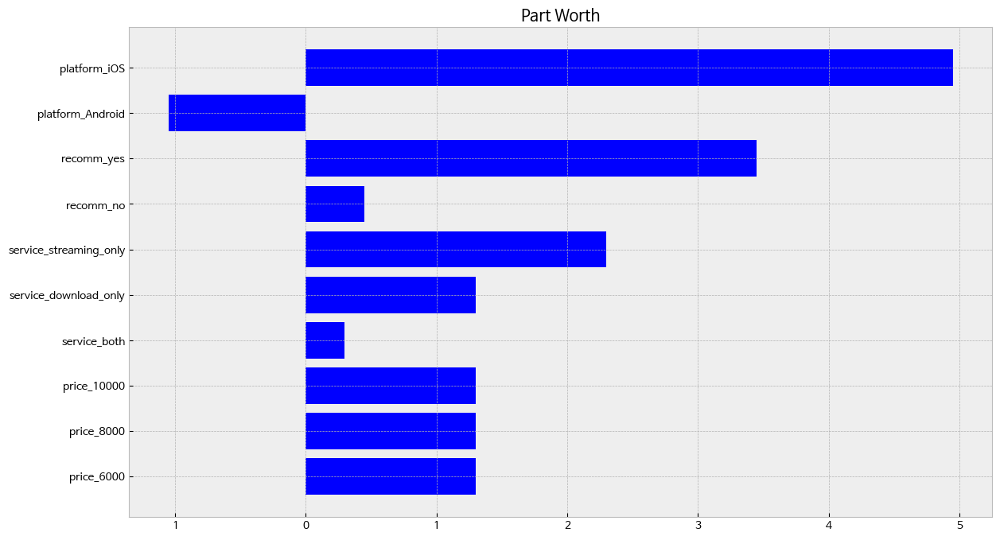

In [ ]:
f, ax = plt.subplots(figsize=(14, 8))
plt.title('Part Worth')
pwu = df_res['param_w']
xbar = np.arange(len(pwu))
plt.barh(xbar, pwu, color=df_res['c'])
plt.yticks(xbar, labels=df_res['param_name'])
plt.show()
# blue if is_sig_95 is true, red if else

### Relative importance plot

In [ ]:
# 각 속성별 "부분 가치 범위" (수준의 최대 - 최소)
importance_per_feature = {k: max(v) - min(v) for k, v in range_per_feature.items()}
importance_per_feature

{'price': 3.1086244689504383e-15,
 'service': 2.000000000000001,
 'recomm': 2.9999999999999982,
 'platform': 5.999999999999997}

In [ ]:
# 각 "속성별 상대적 중요도"의 백분율
# relative_importance_per_feature = 각 특성이 전체 중요도에서 차지하는 상대적인 비중
total_feature_importance = sum(importance_per_feature.values())
relative_importance_per_feature = {
    k: 100 * round(v/total_feature_importance, 3) for k, v in importance_per_feature.items()}
relative_importance_per_feature

{'price': 0.0, 'service': 18.2, 'recomm': 27.3, 'platform': 54.50000000000001}

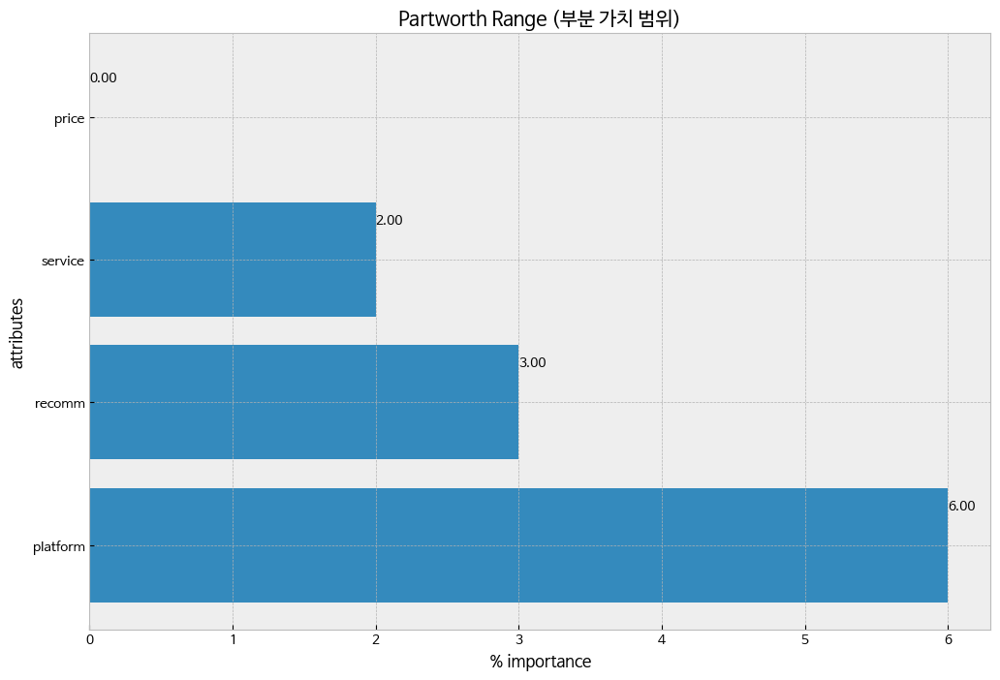

In [ ]:
alt_data = pd.DataFrame(list(importance_per_feature.items()),
    columns=['attr', 'importance']
    ).sort_values(by='importance', ascending=False)

f, ax = plt.subplots(figsize=(12, 8))
xbar = np.arange(len(alt_data['attr']))
plt.title('Partworth Range (부분 가치 범위)')
plt.barh(xbar, alt_data['importance'])
for i, v in enumerate(alt_data['importance']):
    ax.text(v , i + .25, '{:.2f}'.format(v))
plt.ylabel('attributes')
plt.xlabel('% importance')
plt.yticks(xbar, alt_data['attr'])
plt.show()

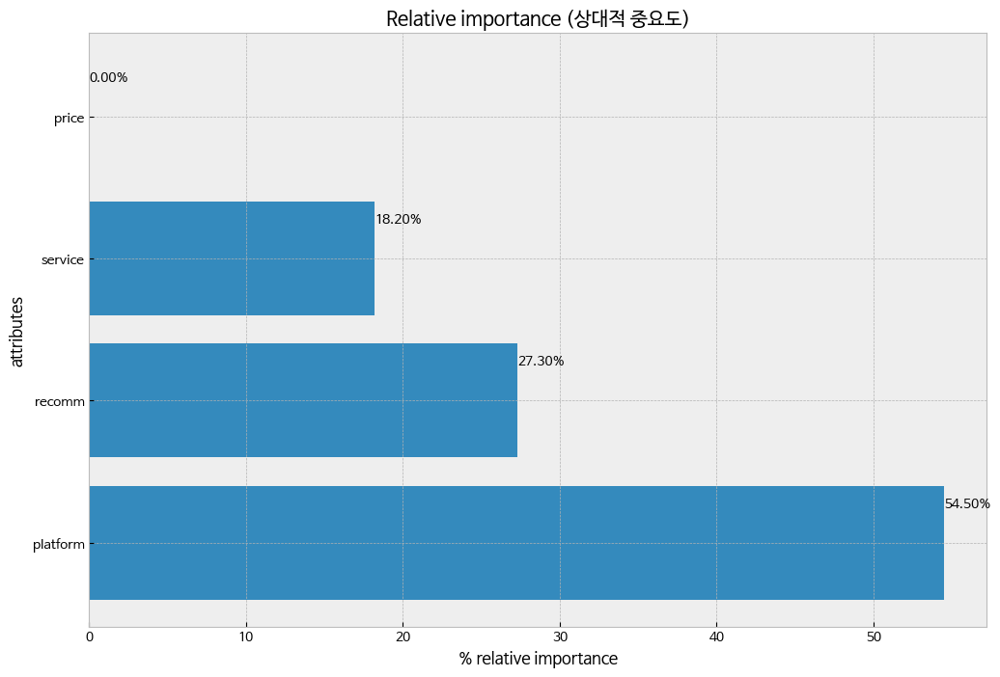

In [ ]:
alt_data = pd.DataFrame(
    list(relative_importance_per_feature.items()),
    columns=['attr', 'relative_importance (pct)']
).sort_values(by='relative_importance (pct)', ascending=False)


f, ax = plt.subplots(figsize=(12, 8))
xbar = np.arange(len(alt_data['attr']))
plt.title('Relative importance (상대적 중요도)')
plt.barh(xbar, alt_data['relative_importance (pct)'])
for i, v in enumerate(alt_data['relative_importance (pct)']):
    ax.text(v , i + .25, '{:.2f}%'.format(v))
plt.ylabel('attributes')
plt.xlabel('% relative importance')
plt.yticks(xbar, alt_data['attr'])
plt.show()

### Partworth in money

속성에 대한 선호도를 금액적인 가치로 추가환산한 값

가격을 측정할 때 소비자에게 얼마나 유리하게 작용할 수 있는가를 나타내는 지표

In [ ]:
df_value=pd.DataFrame({
    'param_name': res_ind.params.keys()
    , 'price of partworth': res_ind.params.values*(df['price'].max() - df['price'].min())/importance_per_feature['price']
})


In [ ]:
df_value[3:]

,param_name,price of partworth
3,service_both,3.860228e+17
4,service_download_only,1.672766e+18
5,service_streaming_only,2.959508e+18
6,recomm_no,5.790342e+17
7,recomm_yes,4.439262e+18
8,platform_Android,-1.351080e+18
9,platform_iOS,6.369377e+18


# Partworth - 2 or more user

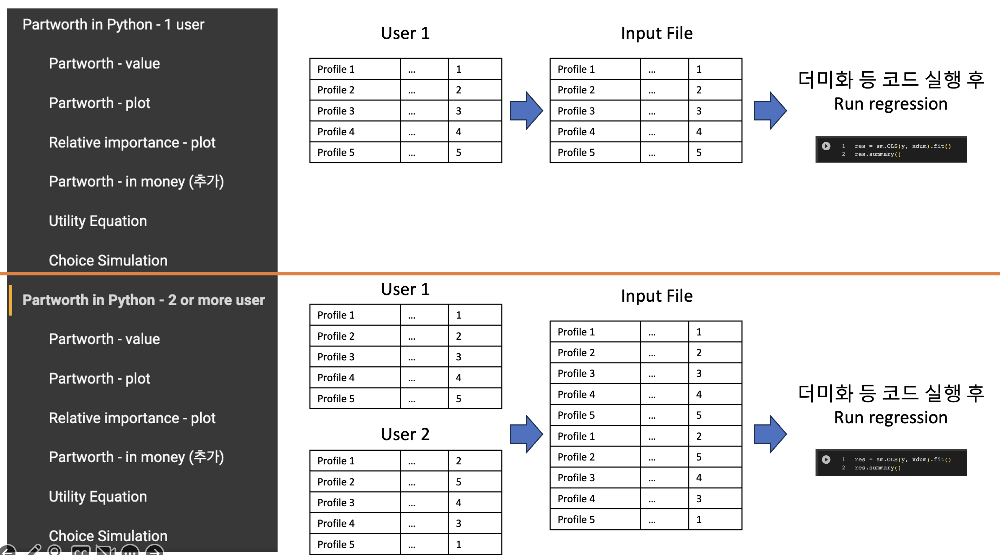

- 여러 참여자들의 설문조사 결과를 모아서 그룹별 CA를 실행할 경우, 특정 그룹의 속성별 민감도를 계산 가능.

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/jej0312/Yonsei_TA/refs/heads/main/data/CA-card_design3.csv')

In [ ]:
df.head()

,Unnamed: 0,price,service,recomm,platform,rating
0,1,6000,streaming_only,yes,iOS,1
1,5,8000,download_only,yes,iOS,2
2,9,10000,both,yes,iOS,3
3,11,8000,streaming_only,no,iOS,4
4,13,6000,download_only,no,iOS,5


In [ ]:
y = (1 + df['rating'].max()) - df['rating'] # 1 ~ maximum rank
x = df[[x for x in df.columns if x != 'rating' and x != 'user' and x!='Unnamed: 0']]
xdum = pd.get_dummies(x, columns=[c for c in x.columns if c != 'user'])

In [ ]:
res = sm.OLS(y, xdum).fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.818
Method:                 Least Squares   F-statistic:                     27.30
Date:                Mon, 23 Sep 2024   Prob (F-statistic):           1.11e-10
Time:                        15:06:05   Log-Likelihood:                -61.588
No. Observations:                  36   AIC:                             137.2
Df Residuals:                      29   BIC:                             148.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
price_6000                 1.6556      0.367      4.517      0.000       0.906       2.405
price_8000                 1.3444      0.367      3.668      0.001       0.595       2.094
price_10000                0.9000      0.367      2.455      0.020       0.150       1.650
service_both               0.2333      0.367      0.637      0.529      -0.516       0.983
service_download_only      1.7889      0.367      4.881      0.000       1.039       2.539
service_streaming_only     1.8778      0.367      5.123      0.000       1.128       2.627
recomm_no                  0.6722      0.260      2.590      0.015       0.141       1.203
recomm_yes                 3.2278      0.260     12.435      0.000       2.697       3.759
platform_Android          -0.8278      0.260     -3.189      0.003      -1.359      -0.297
platform_iOS               4.7278      0.260     18.214      0.000       4.197       5.259
==============================================================================
Omnibus:                       40.286   Durbin-Watson:                   2.383
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              158.163
Skew:                           2.461   Prob(JB):                     4.52e-35
Kurtosis:                      12.012   Cond. No.                     6.51e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.41e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

## Partworth value

In [ ]:
range_per_feature = dict()
for key, coeff in res.params.items():
    sk =  key.split('_')
    feature = sk[0]
    if len(sk) == 1:
        feature = key
    if feature not in range_per_feature:
        range_per_feature[feature] = list()

    range_per_feature[feature].append(coeff)

In [ ]:
# 각 속성의 "수준별 부분가치"
range_per_feature

{'price': [1.6555555555555563, 1.3444444444444459, 0.8999999999999997],
 'service': [0.23333333333333306, 1.7888888888888919, 1.8777777777777802],
 'recomm': [0.672222222222224, 3.2277777777777774],
 'platform': [-0.8277777777777773, 4.727777777777774]}

In [ ]:
# 각 속성별 "부분 가치 범위" (수준의 최대 - 최소)
importance_per_feature = {k: max(v) - min(v) for k, v in range_per_feature.items()}
importance_per_feature

{'price': 0.7555555555555566,
 'service': 1.644444444444447,
 'recomm': 2.5555555555555536,
 'platform': 5.555555555555552}

In [ ]:
# 각 "속성별 상대적 중요도"의 백분율
# relative_importance_per_feature = 각 특성이 전체 중요도에서 차지하는 상대적인 비중
total_feature_importance = sum(importance_per_feature.values())
relative_importance_per_feature = {
    k: 100 * round(v/total_feature_importance, 3) for k, v in importance_per_feature.items()}
relative_importance_per_feature

{'price': 7.199999999999999,
 'service': 15.6,
 'recomm': 24.3,
 'platform': 52.900000000000006}

## Partworth plot

In [ ]:
df_res = pd.DataFrame({
    'param_name': res.params.keys()
    , 'param_w': res.params.values
    , 'pval': res.pvalues
})

# marking field is significant under 95% confidence interval
df_res['is_sig_95'] = (df_res['pval'] < 0.05)
# blue if is_sig_95 is true, red if else

# constructing color naming for each param
df_res['c'] = ['blue' if x else 'red' for x in df_res['is_sig_95']]
# blue if is_sig_95 is true, red if else

In [ ]:
df_res

,param_name,param_w,pval,is_sig_95,c
price_6000,price_6000,1.655556,9.690579e-05,True,blue
price_8000,price_8000,1.344444,9.771944e-04,True,blue
price_10000,price_10000,0.900000,2.030195e-02,True,blue
service_both,service_both,0.233333,5.293738e-01,False,red
service_download_only,service_download_only,1.788889,3.534275e-05,True,blue
service_streaming_only,service_streaming_only,1.877778,1.801161e-05,True,blue
recomm_no,recomm_no,0.672222,1.486829e-02,True,blue
recomm_yes,recomm_yes,3.227778,3.795577e-13,True,blue
platform_Android,platform_Android,-0.827778,3.412684e-03,True,blue
platform_iOS,platform_iOS,4.727778,2.038686e-17,True,blue


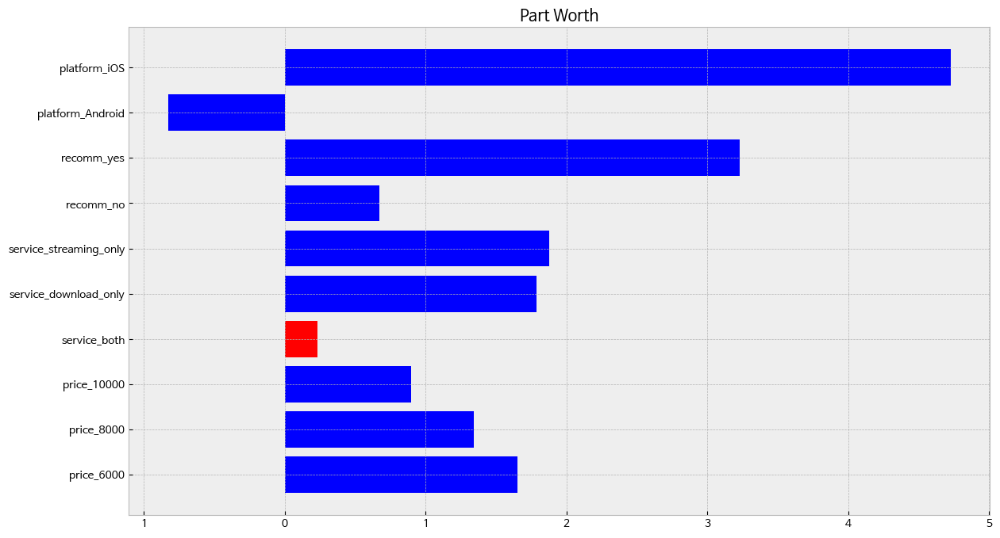

In [ ]:
f, ax = plt.subplots(figsize=(14, 8))
plt.title('Part Worth')
pwu = df_res['param_w']
xbar = np.arange(len(pwu))
plt.barh(xbar, pwu, color=df_res['c'])
plt.yticks(xbar, labels=df_res['param_name'])
plt.show()

## Relative importance plot

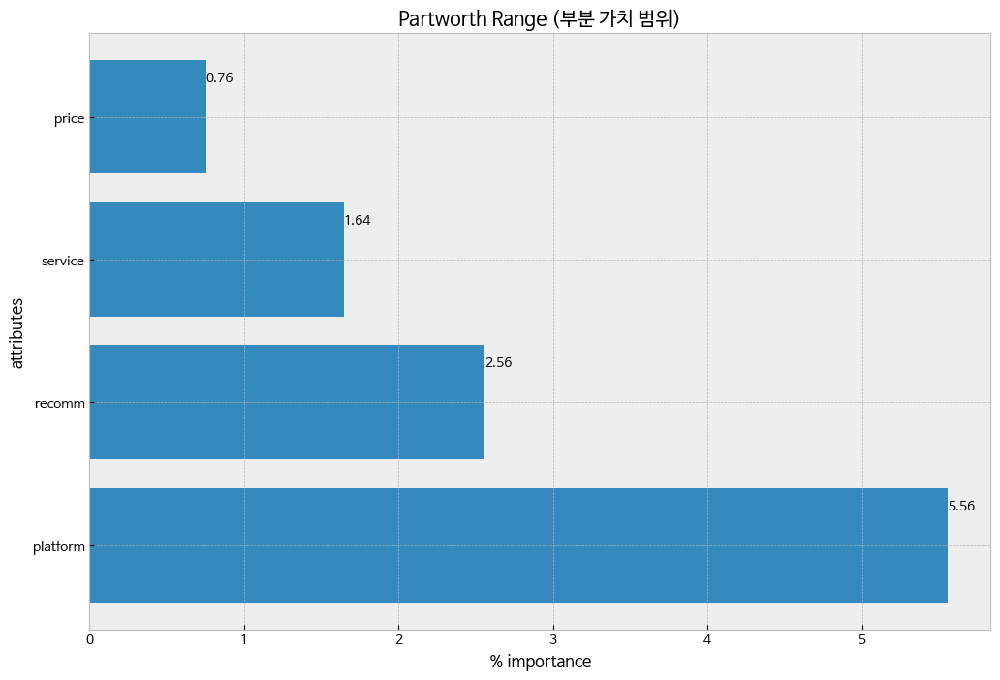

In [ ]:
alt_data = pd.DataFrame(list(importance_per_feature.items()),
    columns=['attr', 'importance']
    ).sort_values(by='importance', ascending=False)


f, ax = plt.subplots(figsize=(12, 8))
xbar = np.arange(len(alt_data['attr']))
plt.title('Partworth Range (부분 가치 범위)')
plt.barh(xbar, alt_data['importance'])
for i, v in enumerate(alt_data['importance']):
    ax.text(v , i + .25, '{:.2f}'.format(v))
plt.ylabel('attributes')
plt.xlabel('% importance')
plt.yticks(xbar, alt_data['attr'])
plt.show()

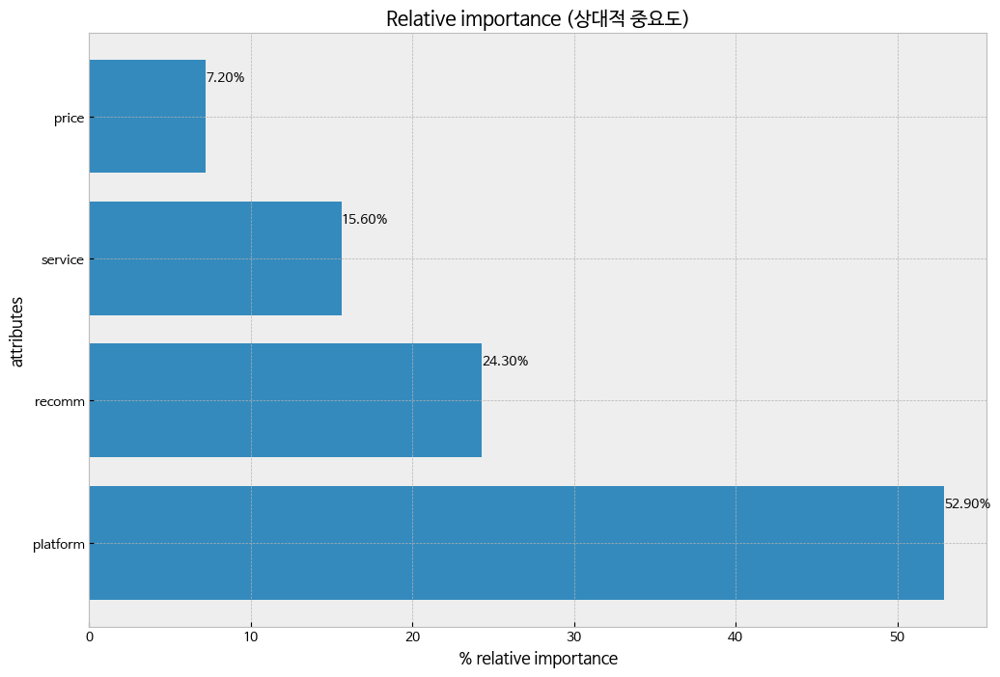

In [ ]:
alt_data = pd.DataFrame(
    list(relative_importance_per_feature.items()),
    columns=['attr', 'relative_importance (pct)']
).sort_values(by='relative_importance (pct)', ascending=False)

f, ax = plt.subplots(figsize=(12, 8))
xbar = np.arange(len(alt_data['attr']))
plt.title('Relative importance (상대적 중요도)')
plt.barh(xbar, alt_data['relative_importance (pct)'])
for i, v in enumerate(alt_data['relative_importance (pct)']):
    ax.text(v , i + .25, '{:.2f}%'.format(v))
plt.ylabel('attributes')
plt.xlabel('% relative importance')
plt.yticks(xbar, alt_data['attr'])
plt.show()

## Partworth in money

In [ ]:
df_value=pd.DataFrame({
    'param_name': res.params.keys()
    , 'price of partworth': res.params.values*(df['price'].max() - df['price'].min())/importance_per_feature['price']
})


In [ ]:
df_value[3:]

,param_name,price of partworth
3,service_both,1235.294118
4,service_download_only,9470.588235
5,service_streaming_only,9941.176471
6,recomm_no,3558.823529
7,recomm_yes,17088.235294
8,platform_Android,-4382.352941
9,platform_iOS,25029.411765


# Choice Simulation

## 1. 사용자별 1순위의 profile

(강의안 101페이지~103페이지 왼쪽)

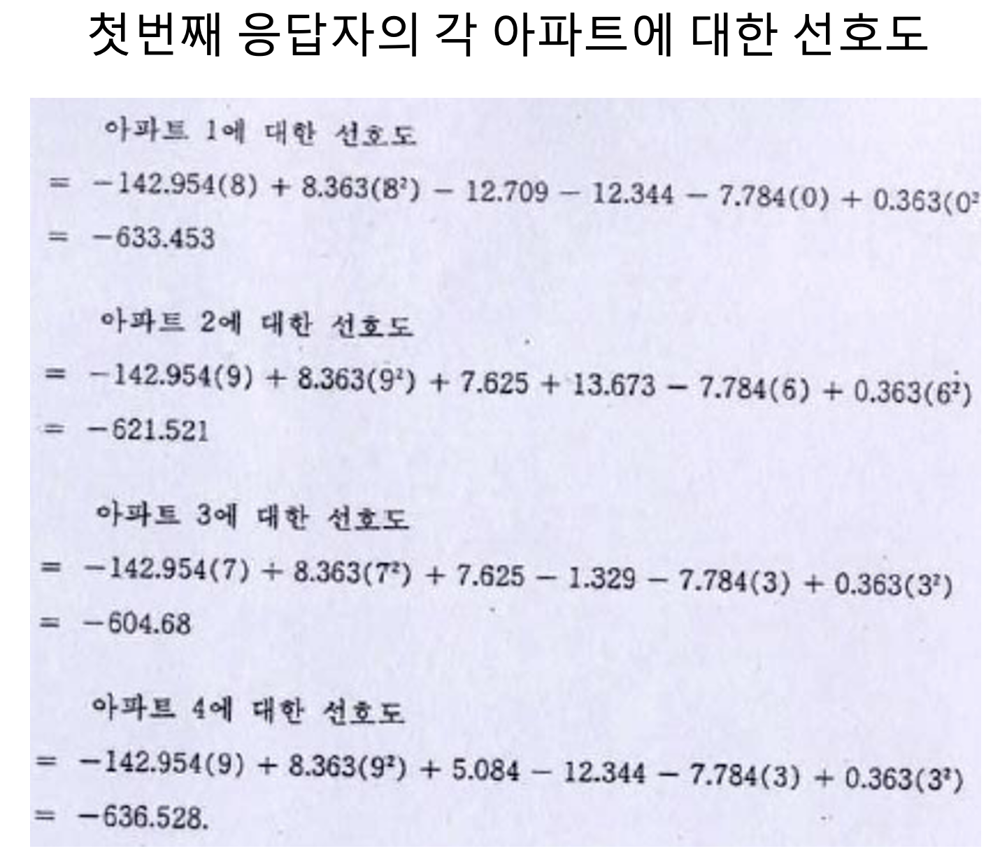

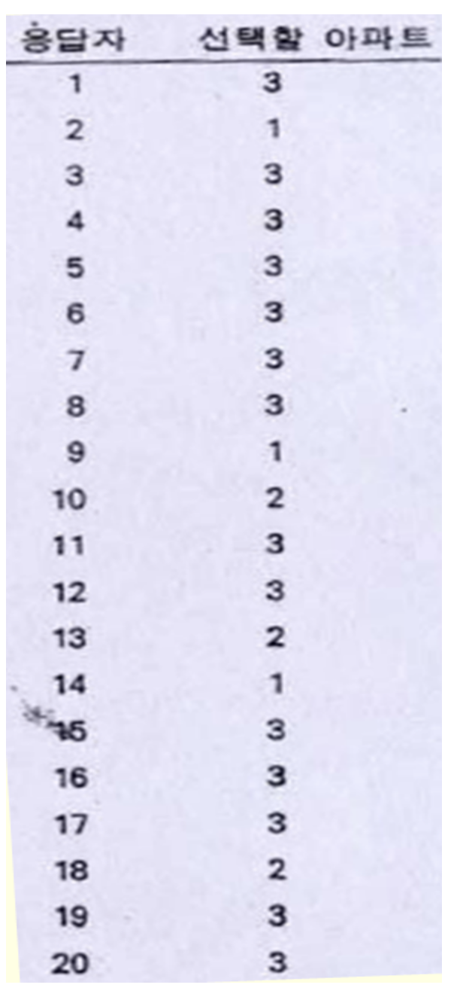

* 1. 코드에서 "Partworth - Single user"(개인 단위 선호도) 코드를 바탕으로 각 응답자간의 속성 및 수준별 part worth를 구한다
* 2. 가상의 프로필에 대하여 위 1. 에서 구해진 각 응답자간의 속성 및 수준별 part worth를 활용하여 "각 응답자별 [가상의 프로필들 중 1순위 선호도 프로필]"를 구한다
    - 위 사진을 보면 "Partworth in Python - 2 or more user"(그룹 단위 선호도)에서 계산한 part worth를 가상의 프로필의 속성과 수준에 알맞게 넣은 후, 이 coeff 값들과 intercept (이 경우에는 16)을 합하면 고객("그룹")의 선호도 순위를 측정할 수 있다 (여러 그룹 간 비교/합계를 위해서는 constant term을 추가하여 개인 간 편향을 고정할 필요가 있음)
    - 위 사진은 고객의 선호도 순위를 계산하는 법을 보여주기 위한 참고용 자료이며, 실제 choice simulation시에는 "그룹 단위 선호도" 결과가 아닌 "개인 단위 선호도" 결과를 사용해야 함
* 3. [각 응답자별 1순위 프로필]들의 빈도수를 바탕으로 가상 프로필들의 시장 점유율을 추정한다

       (Ex) 20명중 5명이 ‘Profile A’을 고르면 ‘Profile A’의 시장 점유율 25% 추정

In [ ]:
# 그룹 간 선호도를 기반으로 segmentation을 계산할 때 intercept term이 추가되어 있는지 확인 필요
xdum_unique=xdum_ind[list(res_ind.params.index)]
xdum_unique

,price_6000,price_8000,price_10000,service_both,service_download_only,service_streaming_only,recomm_no,recomm_yes,platform_Android,platform_iOS
0,1,0,0,0,0,1,0,1,0,1
1,0,1,0,0,1,0,0,1,0,1
2,0,0,1,1,0,0,0,1,0,1
3,0,1,0,0,0,1,1,0,0,1
4,1,0,0,0,1,0,1,0,0,1
5,0,0,1,1,0,0,1,0,0,1
6,1,0,0,0,0,1,0,1,1,0
7,0,0,1,0,1,0,0,1,1,0
8,0,1,0,1,0,0,0,1,1,0
9,0,0,1,0,0,1,1,0,1,0


In [ ]:
utility= xdum_unique * res_ind.params.values
utility

,price_6000,price_8000,price_10000,service_both,service_download_only,service_streaming_only,recomm_no,recomm_yes,platform_Android,platform_iOS
0,1.3,0.0,0.0,0.0,0.0,2.3,0.00,3.45,-0.00,4.95
1,0.0,1.3,0.0,0.0,1.3,0.0,0.00,3.45,-0.00,4.95
2,0.0,0.0,1.3,0.3,0.0,0.0,0.00,3.45,-0.00,4.95
3,0.0,1.3,0.0,0.0,0.0,2.3,0.45,0.00,-0.00,4.95
4,1.3,0.0,0.0,0.0,1.3,0.0,0.45,0.00,-0.00,4.95
5,0.0,0.0,1.3,0.3,0.0,0.0,0.45,0.00,-0.00,4.95
6,1.3,0.0,0.0,0.0,0.0,2.3,0.00,3.45,-1.05,0.00
7,0.0,0.0,1.3,0.0,1.3,0.0,0.00,3.45,-1.05,0.00
8,0.0,1.3,0.0,0.3,0.0,0.0,0.00,3.45,-1.05,0.00
9,0.0,0.0,1.3,0.0,0.0,2.3,0.45,0.00,-1.05,0.00


In [ ]:
# coef 값 sum 하는 열 생성
# preference = 선호도. 이 중 가장 높은것들이 1순위. 즉 각 응답자별로 가상 프로필 중 선호도가 높은 것.
utility['preferences']=utility.sum(axis=1)

In [ ]:
utility.sort_values(by='preferences',ascending=False)

,price_6000,price_8000,price_10000,service_both,service_download_only,service_streaming_only,recomm_no,recomm_yes,platform_Android,platform_iOS,preferences
0,1.3,0.0,0.0,0.0,0.0,2.3,0.00,3.45,-0.00,4.95,12.0
1,0.0,1.3,0.0,0.0,1.3,0.0,0.00,3.45,-0.00,4.95,11.0
2,0.0,0.0,1.3,0.3,0.0,0.0,0.00,3.45,-0.00,4.95,10.0
3,0.0,1.3,0.0,0.0,0.0,2.3,0.45,0.00,-0.00,4.95,9.0
4,1.3,0.0,0.0,0.0,1.3,0.0,0.45,0.00,-0.00,4.95,8.0
5,0.0,0.0,1.3,0.3,0.0,0.0,0.45,0.00,-0.00,4.95,7.0
6,1.3,0.0,0.0,0.0,0.0,2.3,0.00,3.45,-1.05,0.00,6.0
7,0.0,0.0,1.3,0.0,1.3,0.0,0.00,3.45,-1.05,0.00,5.0
8,0.0,1.3,0.0,0.3,0.0,0.0,0.00,3.45,-1.05,0.00,4.0
9,0.0,0.0,1.3,0.0,0.0,2.3,0.45,0.00,-1.05,0.00,3.0


## 2. BTL 방법

(103페이지 오른쪽)

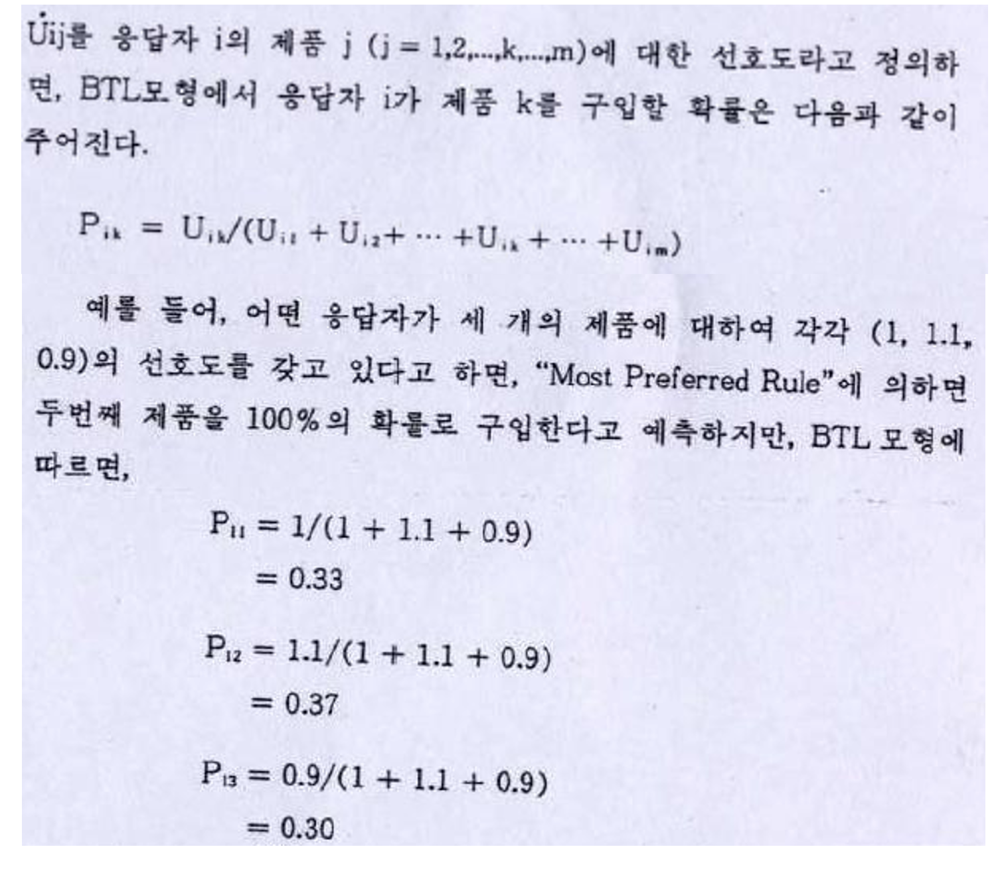

Ex) P13 = 1번째 응답자가 3번째 제품에 대해 가지고 있는 선호도

위 [1]에서는 1번째 응답자는 2번째 제품을 구매할 확률이 100%라 하였지만,

[2]에서는 1번쨰 응답자가 2번째 제품을 구매할 확률이 37%로 낮춰졌다.

이를 각 응답자별로 구하면 보다 현실적인 market segmentation 추정이 가능하다.

## 3. 로짓 모형

(104페이지)

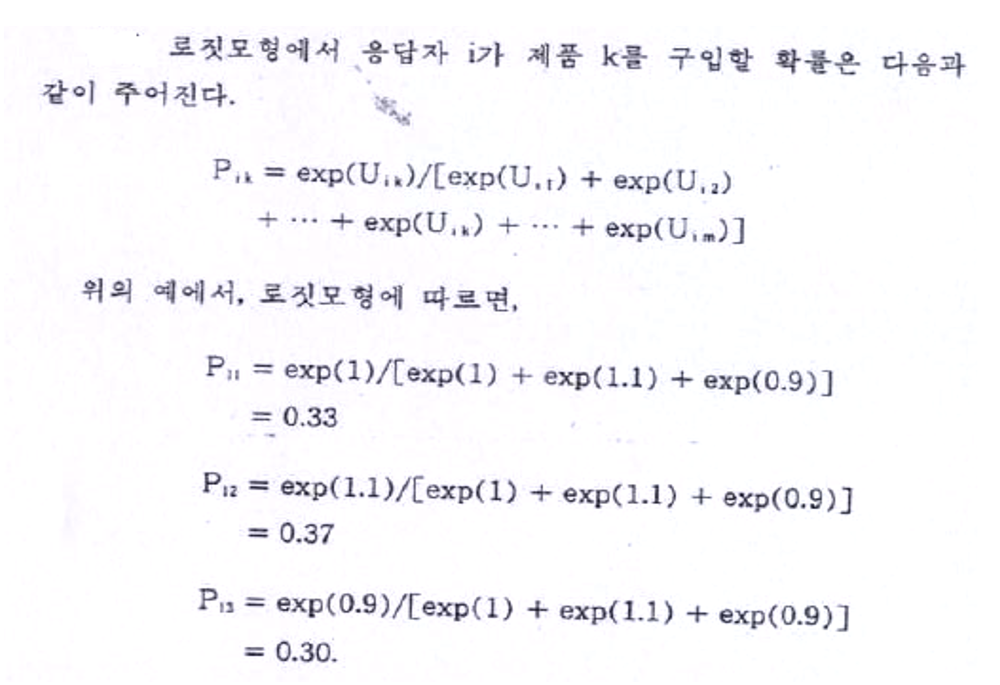

[2] 에서 exponential 로 변형한 방법이며, 응답자의 선호도가 음수 일때도 사용 가능

# 참고 논문

- Sisodia, A., Burnap, A., & Kumar, V. (2024). EXPRESS: Generative Interpretable Visual Design: Using Disentanglement for Visual Conjoint Analysis. Journal of Marketing Research, 00222437241276736.

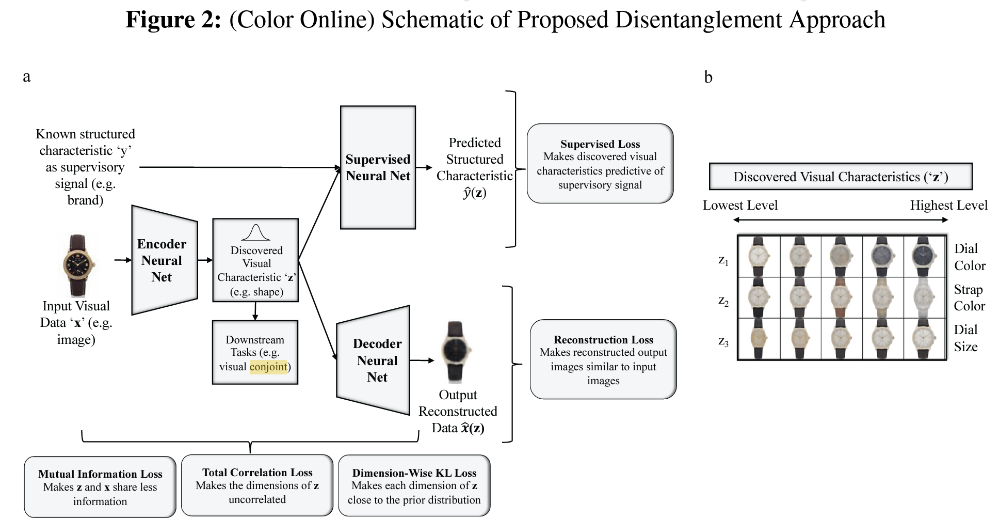

- Wu, P., Tang, T., Zhou, L., & Martínez, L. (2024). A decision-support model through online reviews: Consumer preference analysis and product ranking. Information Processing & Management, 61(4), 103728.

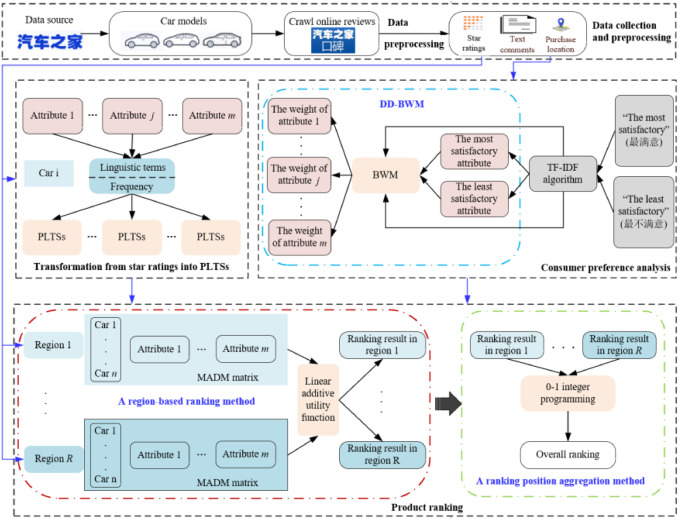

# 그 외 예시 (참고용)

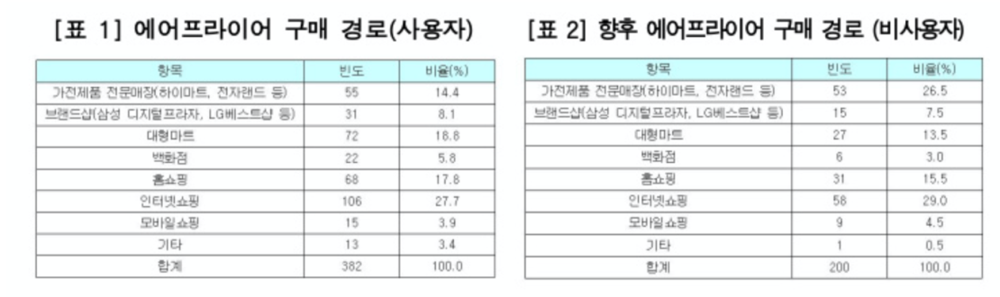

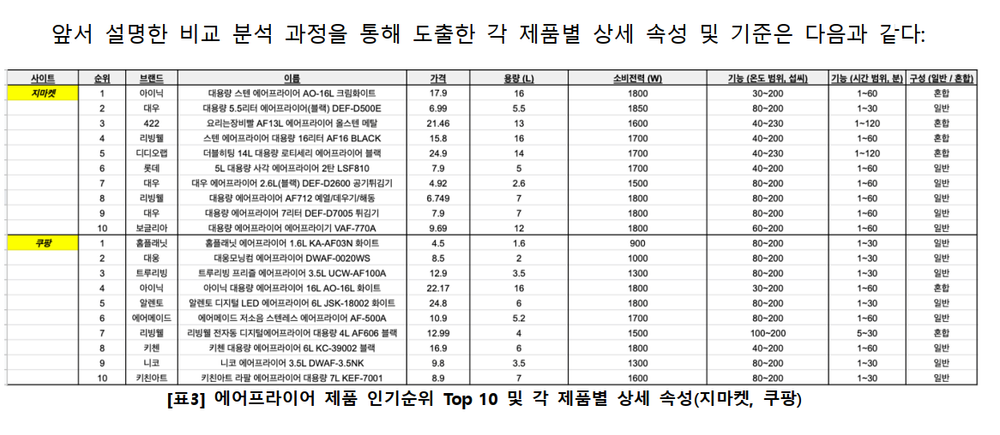

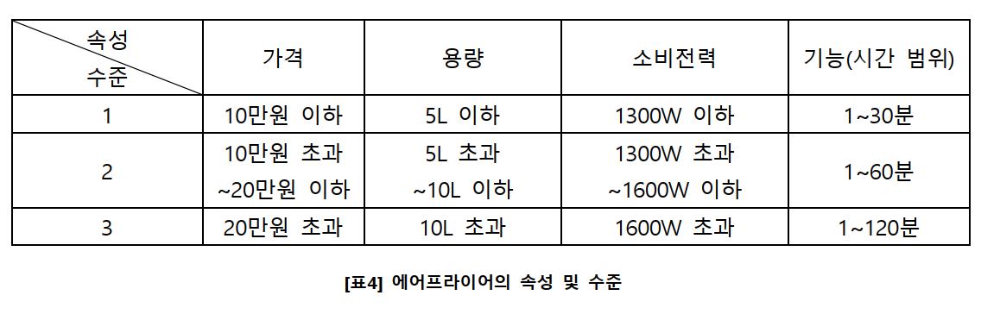

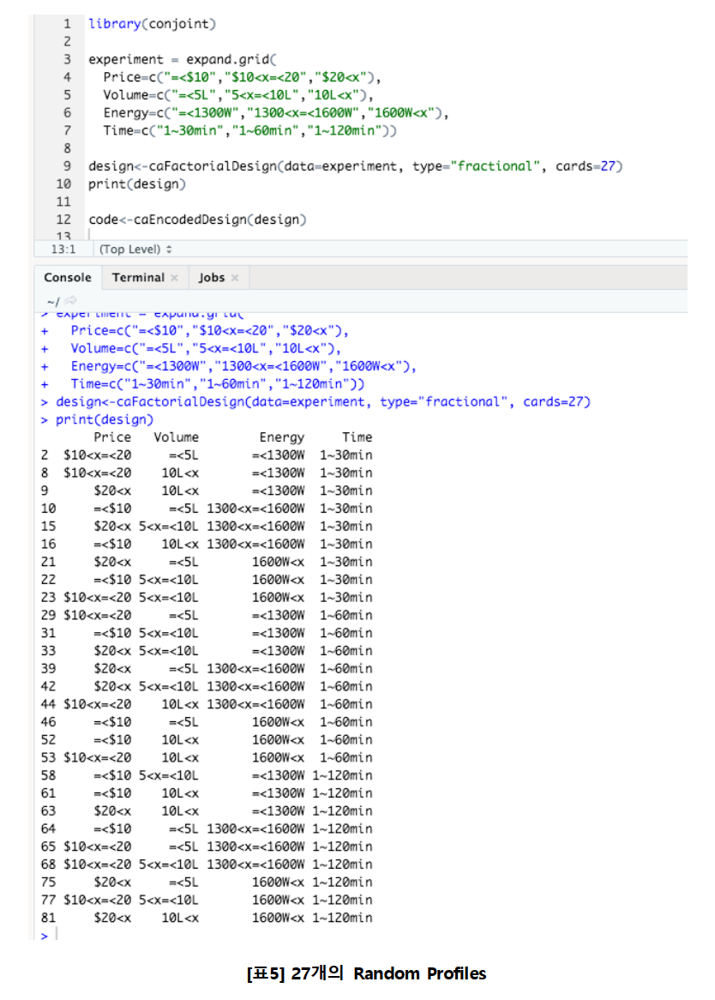

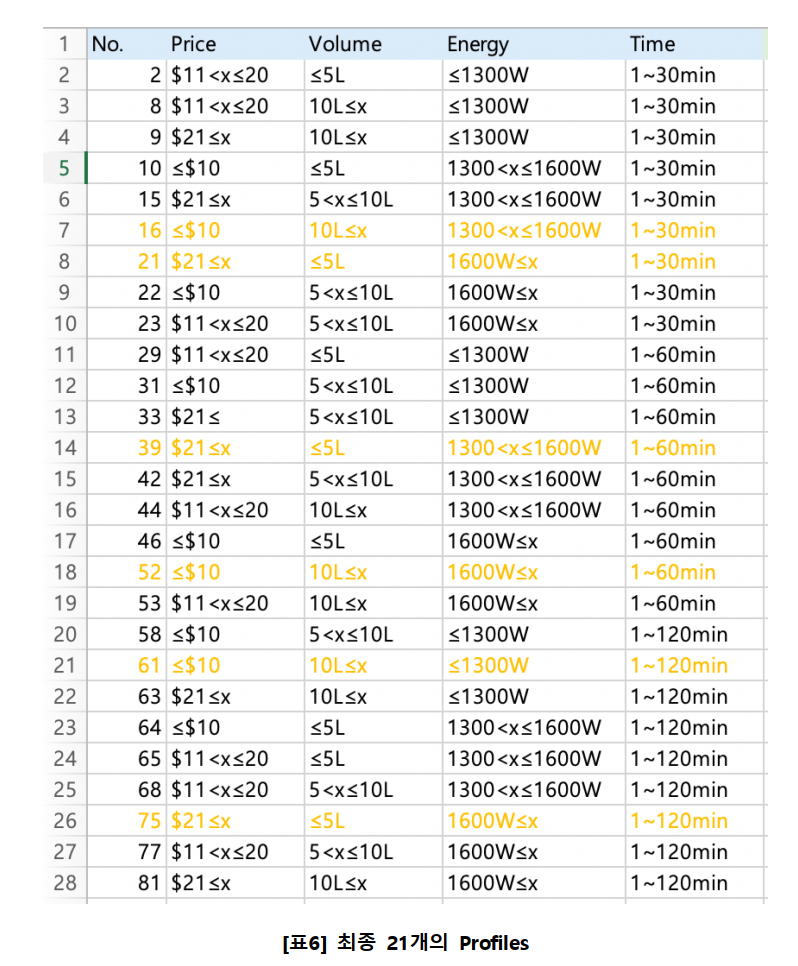


노란색은 infeasible profile

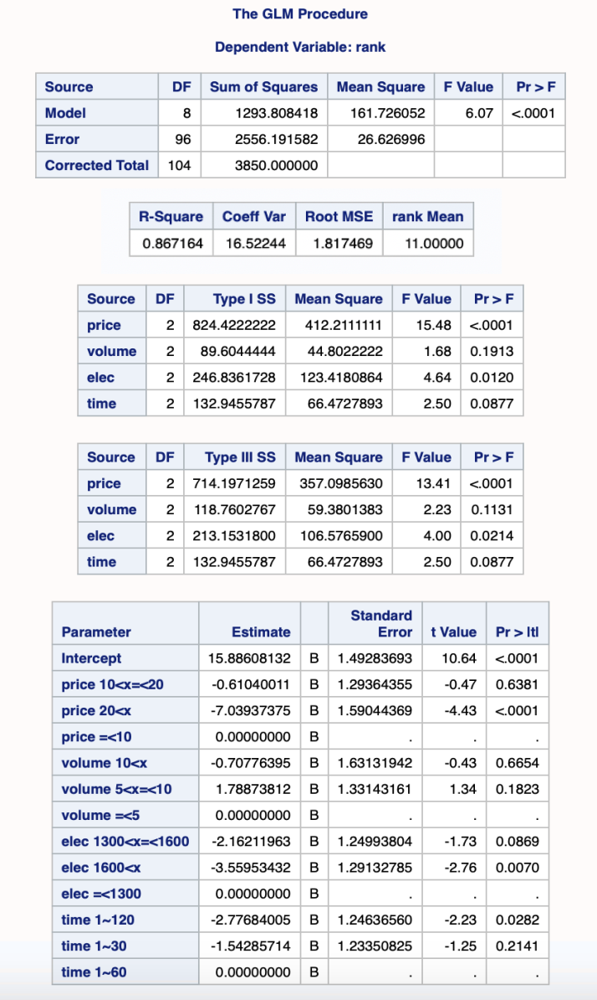

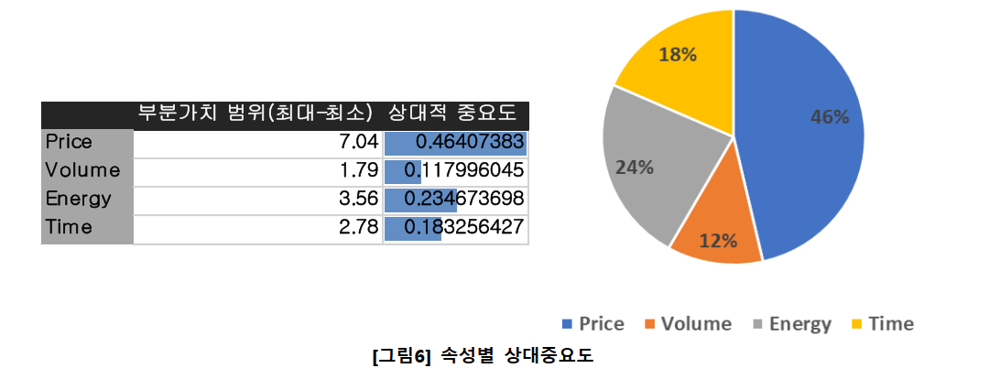

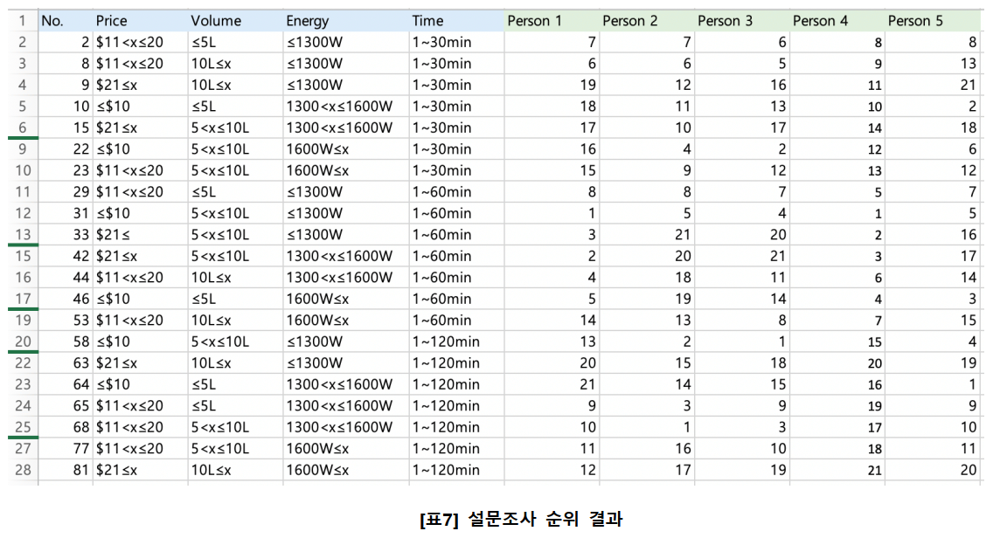

21개 프로파일 * 5명 = 105개

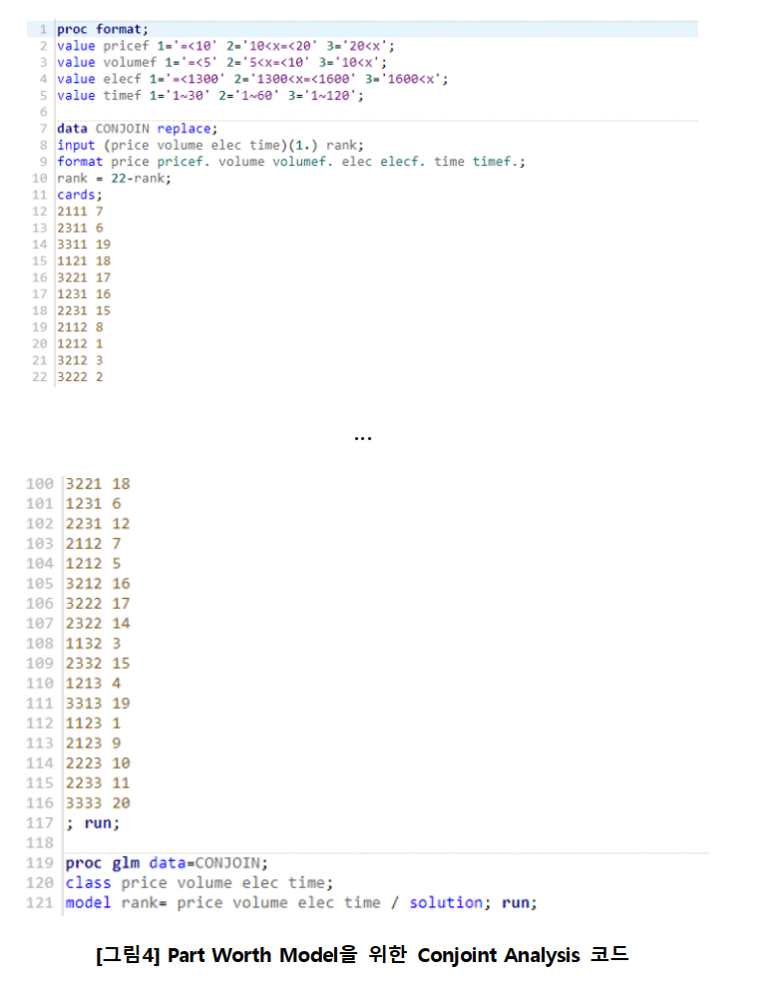

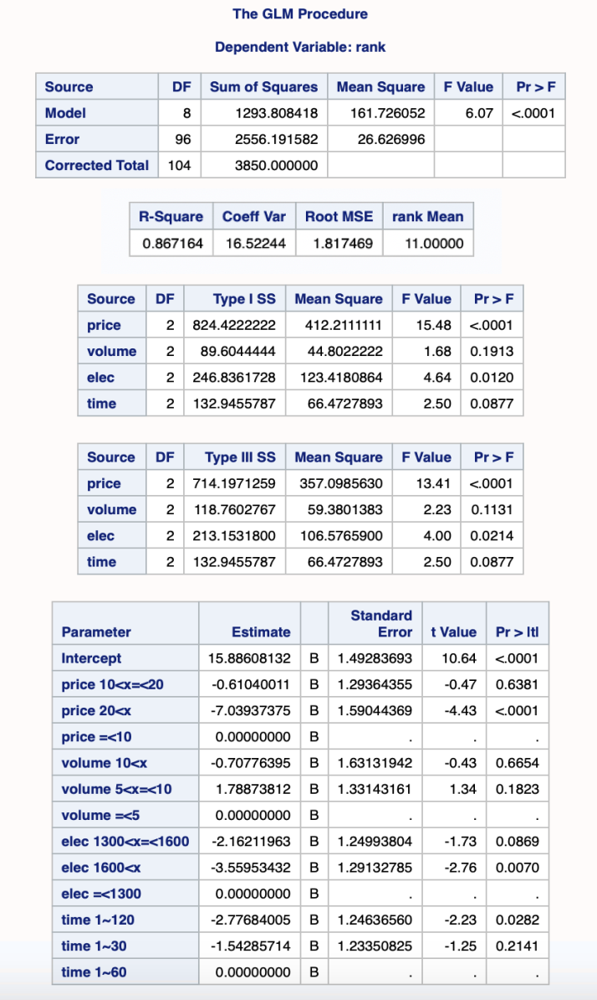

에어프라이어 예시]

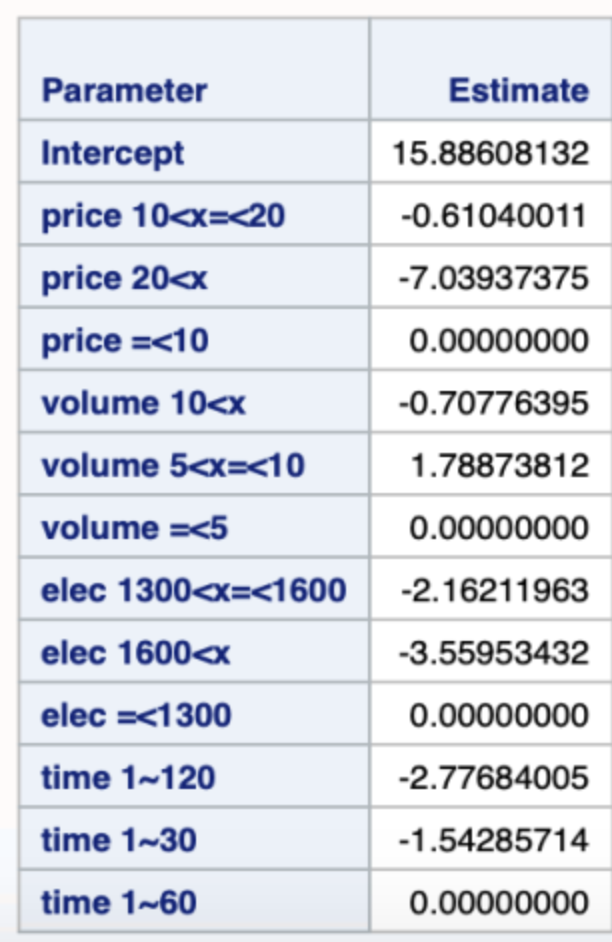

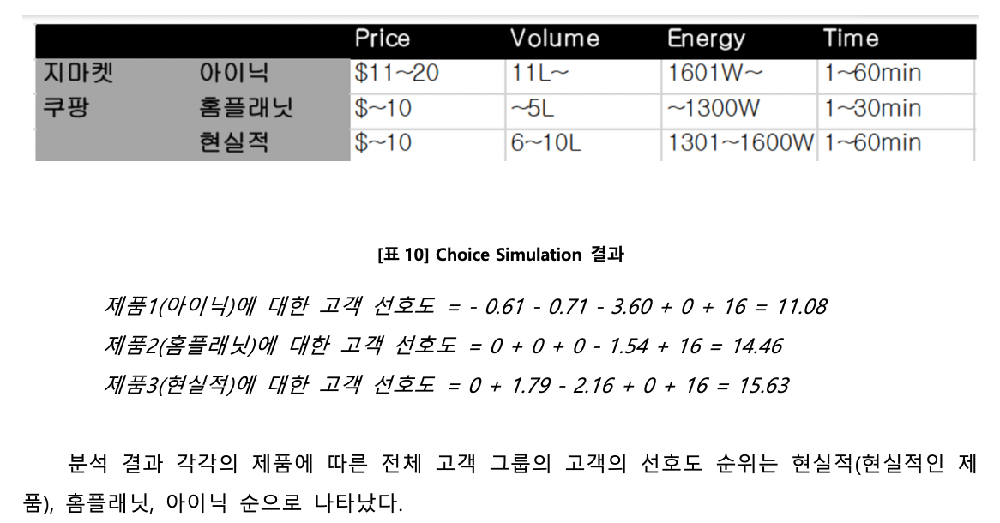